In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.7/914.7 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 43.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 210MB/s]


In [ ]:
image = cv2.imread("persondog.jpg", cv2.IMREAD_GRAYSCALE)
cv2.imwrite("persondog_gray.jpg", image)
results= model("persondog_gray.jpg")
for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

result.save("output.jpg")



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 231.2ms
Speed: 7.3ms preprocess, 231.2ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865.6488647460938, 223.77503967285156, 1160.6080322265625, 1015.247802734375)
Class: 0, Confidence: 0.91, BBox: (572.4967651367188, 168.87008666992188, 856.73291015625, 1009.930419921875)
Class: 16, Confidence: 0.91, BBox: (1261.4495849609375, 670.640625, 1534.609130859375, 1048.7369384765625)


'output.jpg'


image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 402.0ms
Speed: 14.3ms preprocess, 402.0ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)
Class: 0, Confidence: 0.91, BBox: (572, 168, 856, 1009)
Class: 16, Confidence: 0.91, BBox: (1261, 670, 1534, 1048)


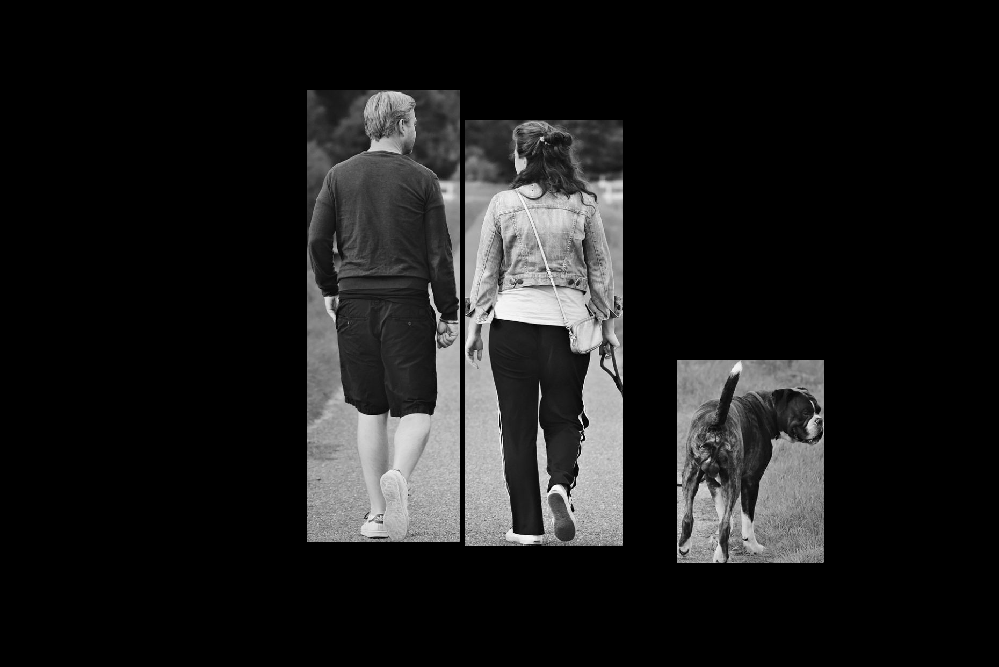

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt') # Load the appropriate model
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Draw the mask
        masked_image[y1:y2, x1:x2] = image[y1:y2, x1:x2]  # Copy only the bbox area

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image) # Use cv2_imshow instead of cv2.imshow
#cv2.waitKey(0) # These lines are not needed with cv2_imshow
#cv2.destroyAllWindows()


image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 284.5ms
Speed: 5.6ms preprocess, 284.5ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)
Class: 0, Confidence: 0.91, BBox: (572, 168, 856, 1009)
Class: 16, Confidence: 0.91, BBox: (1261, 670, 1534, 1048)


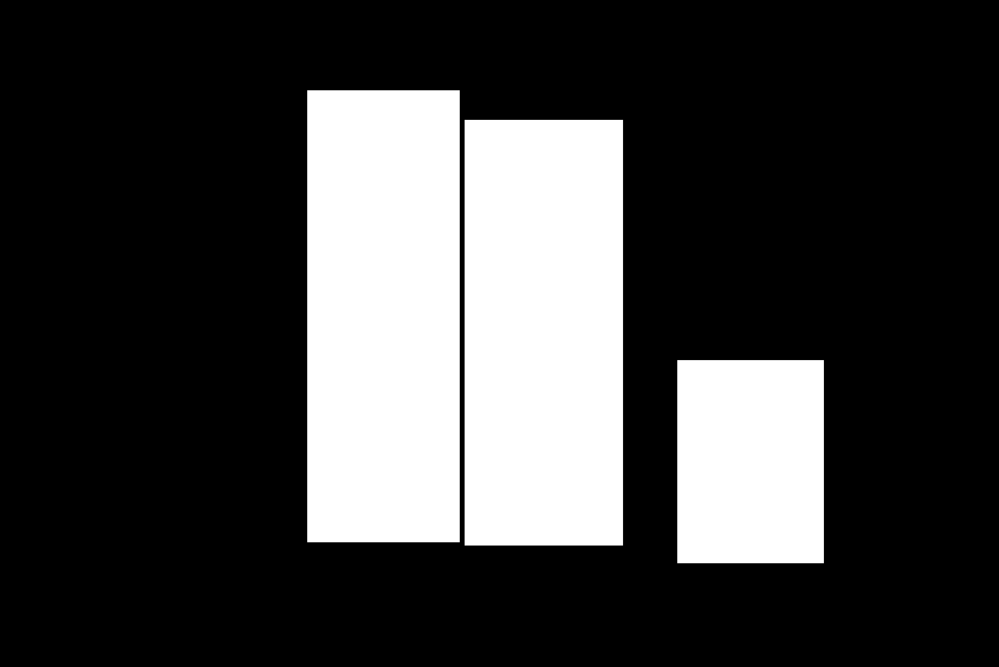

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')# Load the appropriate model
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)  # Set pixel values to white

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image) # Use cv2_imshow instead of cv2.imshow


image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 272.9ms
Speed: 6.0ms preprocess, 272.9ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)
Class: 0, Confidence: 0.91, BBox: (572, 168, 856, 1009)
Class: 16, Confidence: 0.91, BBox: (1261, 670, 1534, 1048)


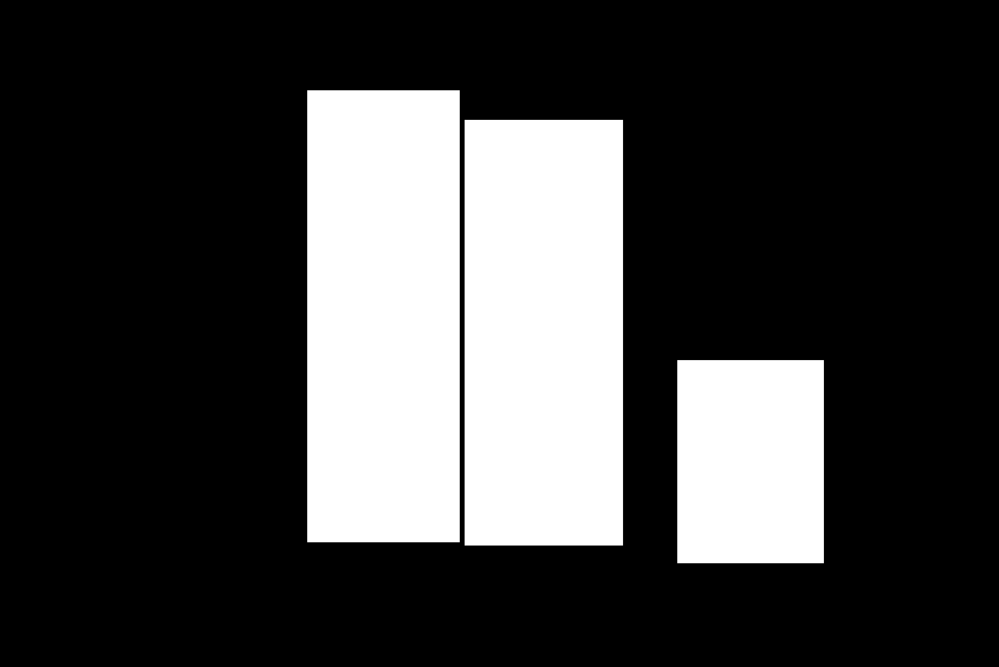

Total number of white pixels: 575678


In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt') # Load the appropriate model
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)  # Set pixel values to white

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image) # Use cv2_imshow instead of cv2.imshow

# Compute the number of white pixels
gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY) # Convert to grayscale
_, binary_mask = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY) # Threshold to get binary mask
white_pixel_count = np.sum(binary_mask == 255)  # Count white pixels

print(f"Total number of white pixels: {white_pixel_count}")


image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 259.2ms
Speed: 5.6ms preprocess, 259.2ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)
Class: 0, Confidence: 0.91, BBox: (572, 168, 856, 1009)
Class: 16, Confidence: 0.91, BBox: (1261, 670, 1534, 1048)


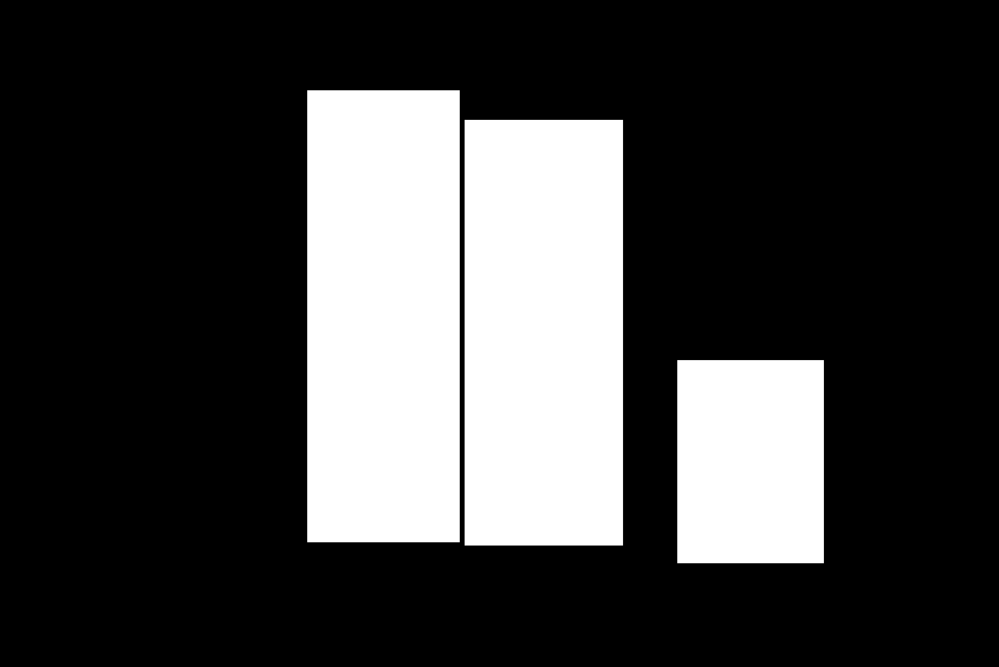

Total number of white pixels: 575678


In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt') # Load the appropriate model
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)  # Set pixel values to white

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image) # Use cv2_imshow instead of cv2.imshow

# Compute the number of white pixels
gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY) # Convert to grayscale
_, binary_mask = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY) # Threshold to get binary mask
white_pixel_count = np.sum(binary_mask == 255)  # Count white pixels

print(f"Total number of white pixels: {white_pixel_count}")

# Accessing white pixel areas using a for loop:
white_pixel_coords = np.where(binary_mask == 255) # Get coordinates of white pixels

for y, x in zip(white_pixel_coords[0], white_pixel_coords[1]):
    # Access the pixel in the original image using the coordinates
    pixel_value = image[y, x]

In [ ]:
for y, x in zip(white_pixel_coords[0], white_pixel_coords[1]):
    # Access the pixel in the original image using the coordinates
    pixel_value = image[y, x]
    print(pixel_value)
    break

[76 76 76]



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 252.4ms
Speed: 12.8ms preprocess, 252.4ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


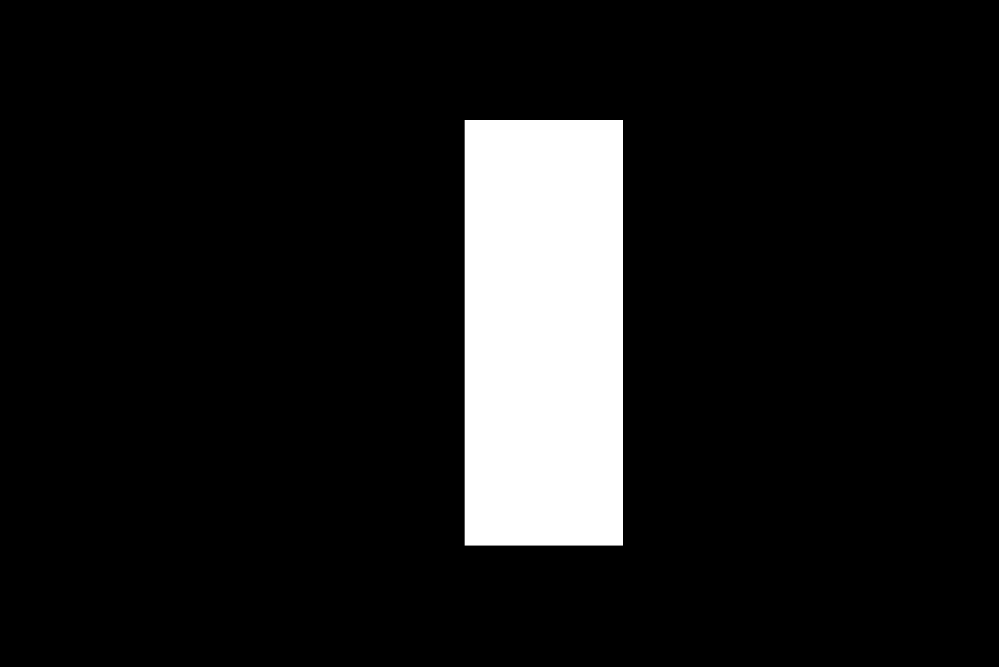

Total number of white pixels: 233640
First bounding box pixel values (sample): [[[57, 57, 57], [56, 56, 56], [55, 55, 55], [54, 54, 54], [53, 53, 53], [53, 53, 53], [53, 53, 53], [53, 53, 53], [54, 54, 54], [56, 56, 56], [57, 57, 57], [58, 58, 58], [58, 58, 58], [58, 58, 58], [57, 57, 57], [61, 61, 61], [61, 61, 61], [61, 61, 61], [62, 62, 62], [63, 63, 63], [64, 64, 64], [65, 65, 65], [66, 66, 66], [71, 71, 71], [72, 72, 72], [74, 74, 74], [75, 75, 75], [75, 75, 75], [74, 74, 74], [72, 72, 72], [71, 71, 71], [76, 76, 76], [74, 74, 74], [71, 71, 71], [69, 69, 69], [67, 67, 67], [65, 65, 65], [61, 61, 61], [59, 59, 59], [62, 62, 62], [62, 62, 62], [62, 62, 62], [62, 62, 62], [62, 62, 62], [63, 63, 63], [63, 63, 63], [64, 64, 64], [61, 61, 61], [61, 61, 61], [60, 60, 60], [59, 59, 59], [56, 56, 56], [54, 54, 54], [52, 52, 52], [51, 51, 51], [51, 51, 51], [49, 49, 49], [48, 48, 48], [47, 47, 47], [47, 47, 47], [48, 48, 48], [47, 47, 47], [46, 46, 46], [50, 50, 50], [48, 48, 48], [48, 48, 

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

first_box_pixels = []  # List to store pixel values of the first bounding box

# Process only the first bounding box
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break  # Stop after processing the first bounding box

        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)  # Set pixel values to white

        # Extract pixel values within the first bounding box
        first_box_pixels = image[y1:y2, x1:x2].tolist()  # Convert to list for easier handling
        first_box_found = True  # Mark that the first box is processed

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)  # Use cv2_imshow instead of cv2.imshow

# Compute the number of white pixels
gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY)
_, binary_mask = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY)
white_pixel_count = np.sum(binary_mask == 255)

print(f"Total number of white pixels: {white_pixel_count}")

# Display the first bounding box pixel values
print(f"First bounding box pixel values (sample): {first_box_pixels[:5]}")  # Print only first 5 rows for brevity



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 336.8ms
Speed: 7.2ms preprocess, 336.8ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


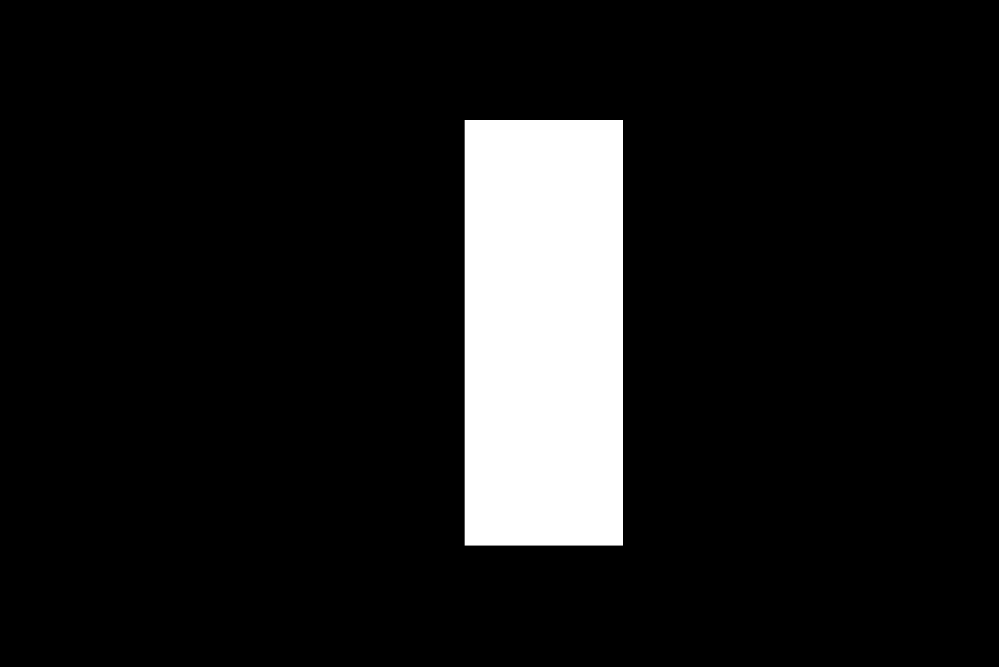

Total number of white pixels: 233640


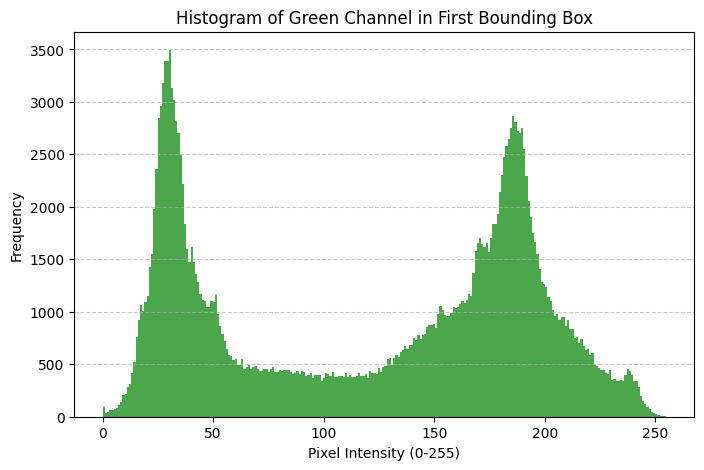

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

first_box_pixels = []  # List to store pixel values of the first bounding box
first_box_found = False  # Flag to track first bounding box

for result in results:
    for box in result.boxes:
        if first_box_found:
            break  # Stop after processing the first bounding box

        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)

        # Extract pixel values within the first bounding box
        first_box_pixels = image[y1:y2, x1:x2]  # Extract as a NumPy array
        first_box_found = True

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Compute the number of white pixels
gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY)
_, binary_mask = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY)
white_pixel_count = np.sum(binary_mask == 255)

print(f"Total number of white pixels: {white_pixel_count}")

# Extract the green channel from the bounding box pixels
green_channel = first_box_pixels[:, :, 1].flatten()  # Extract green channel and flatten

# Plot the histogram
plt.figure(figsize=(8, 5))
plt.hist(green_channel, bins=256, color='green', alpha=0.7)
plt.title("Histogram of Green Channel in First Bounding Box")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 278.2ms
Speed: 5.6ms preprocess, 278.2ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


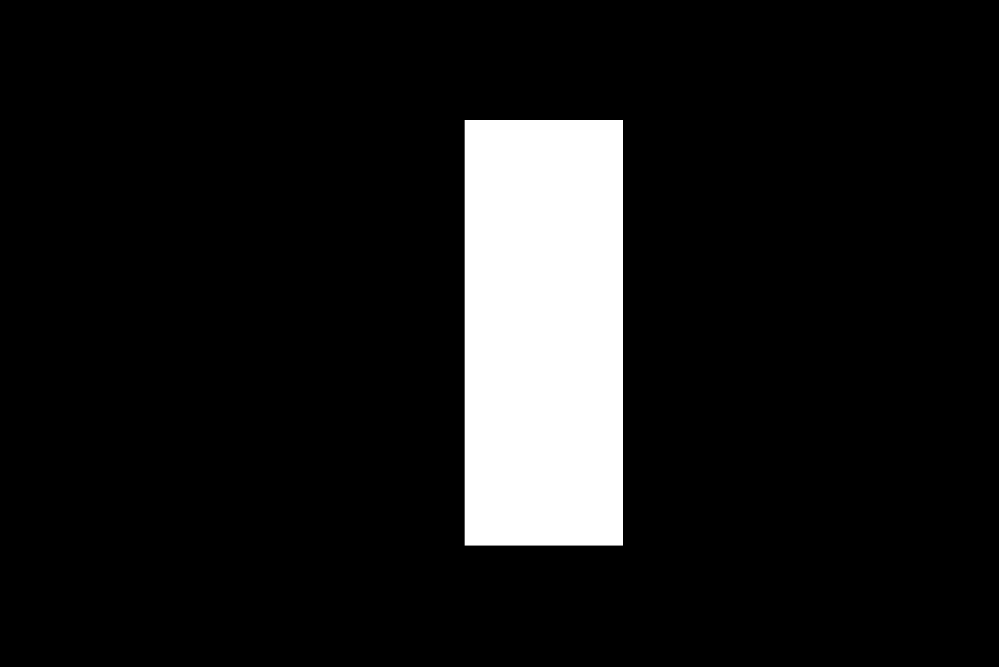

Total number of white pixels: 233640
Maximum bin value: 3494 (Intensity: 29.8828125)


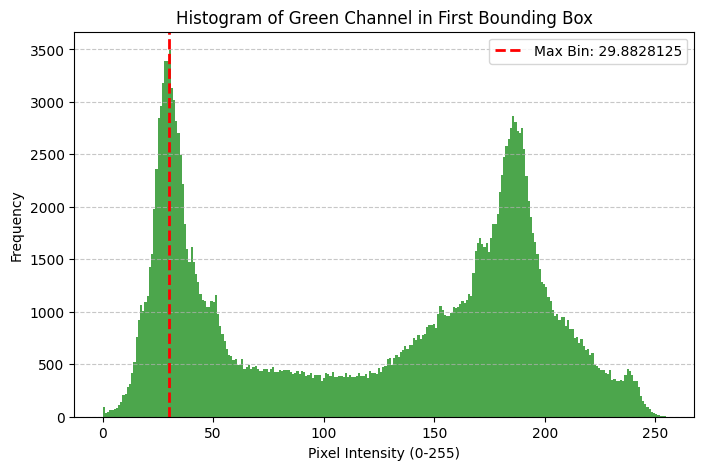

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

first_box_pixels = []  # List to store pixel values of the first bounding box
first_box_found = False  # Flag to track first bounding box

for result in results:
    for box in result.boxes:
        if first_box_found:
            break  # Stop after processing the first bounding box

        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)

        # Extract pixel values within the first bounding box
        first_box_pixels = image[y1:y2, x1:x2]  # Extract as a NumPy array
        first_box_found = True

# Save the output image
cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Compute the number of white pixels
gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY)
_, binary_mask = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY)
white_pixel_count = np.sum(binary_mask == 255)

print(f"Total number of white pixels: {white_pixel_count}")

# Extract the green channel from the bounding box pixels
green_channel = first_box_pixels[:, :, 1].flatten()  # Extract green channel and flatten

# Compute histogram using NumPy
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find the maximum bin value
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = bin_edges[max_bin_index]

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Plot the histogram
plt.figure(figsize=(8, 5))
plt.hist(green_channel, bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel in First Bounding Box")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 460.6ms
Speed: 5.5ms preprocess, 460.6ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


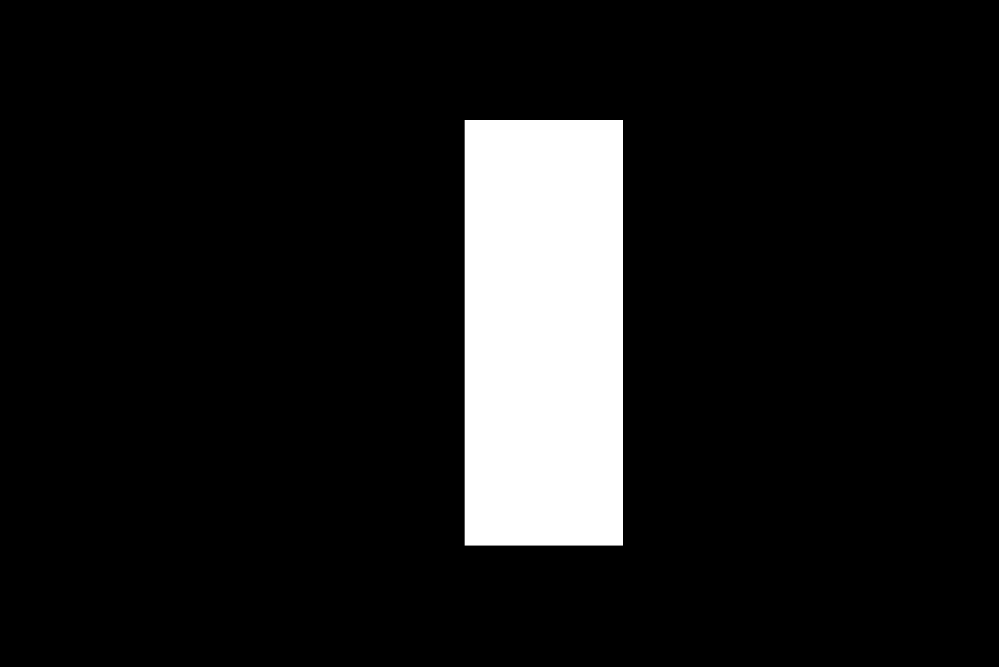

[ 57  56  55 ... 132 117 125]
Maximum bin value: 3494 (Intensity: 29)
Pixels with intensity 29: 3387


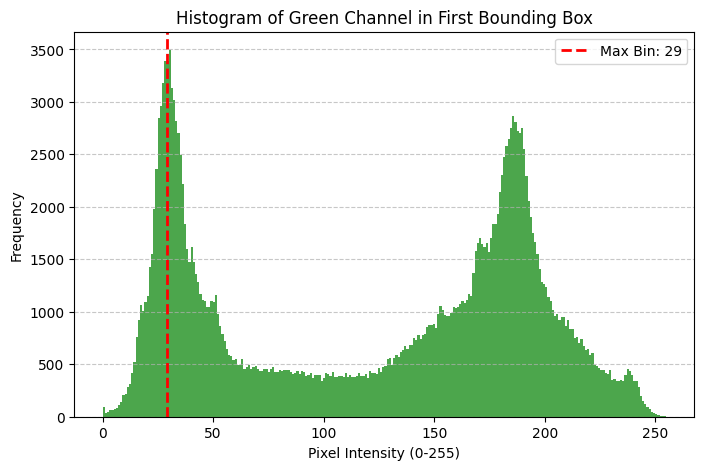

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2]
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1].flatten()
print(green_channel)
# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin index and correct the intensity value
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(bin_edges[max_bin_index])  # Convert to integer

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Count how many pixels have this intensity
matching_pixels = np.sum(green_channel == max_bin_intensity)
print(f"Pixels with intensity {max_bin_intensity}: {matching_pixels}")

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(green_channel, bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel in First Bounding Box")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 300.7ms
Speed: 8.7ms preprocess, 300.7ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


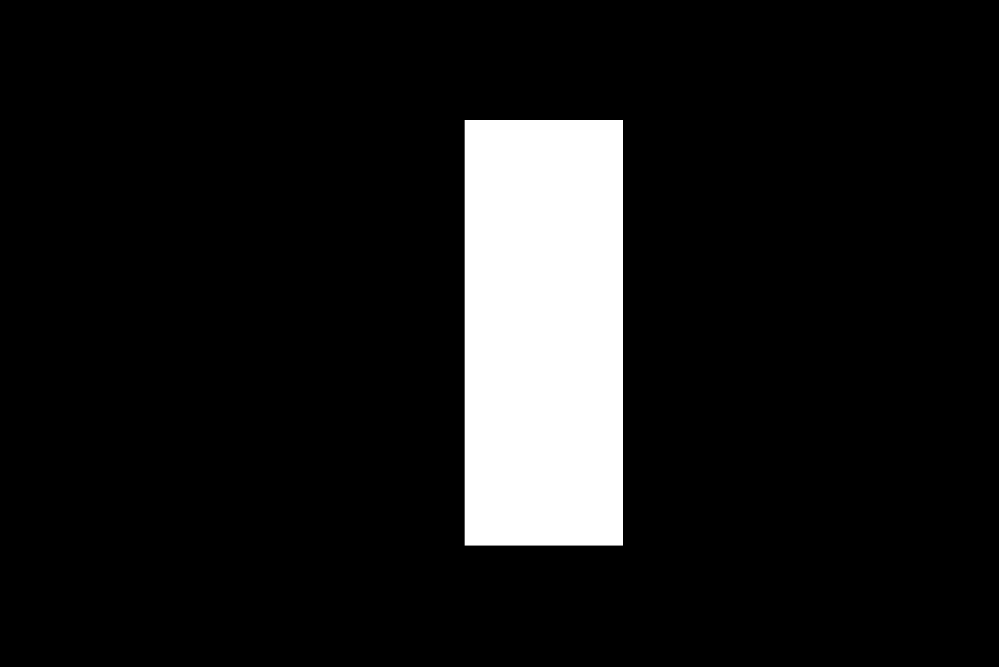

Maximum bin value: 3494 (Intensity: 30)
Generated Watermark Bits (first 50): [1 1 1 0 1 1 0 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 1 1 1 0 1 0 0 0 0 1]


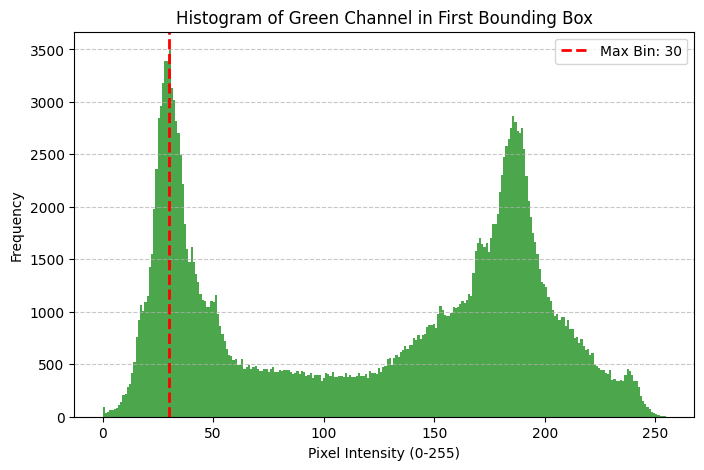

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2]
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1].flatten()

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin index and correct the intensity value
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(round(bin_edges[max_bin_index]))  # Convert to integer

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Generate random watermark bits (0s and 1s) of size equal to max_bin_value
watermark_bits = np.random.randint(0, 2, size=max_bin_value)

# Display the first 50 bits for reference
print(f"Generated Watermark Bits (first 50): {watermark_bits[:50]}")

# Save watermark bits to a file
np.savetxt("watermark_bits.txt", watermark_bits, fmt="%d")

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(green_channel, bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel in First Bounding Box")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 254.7ms
Speed: 5.6ms preprocess, 254.7ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


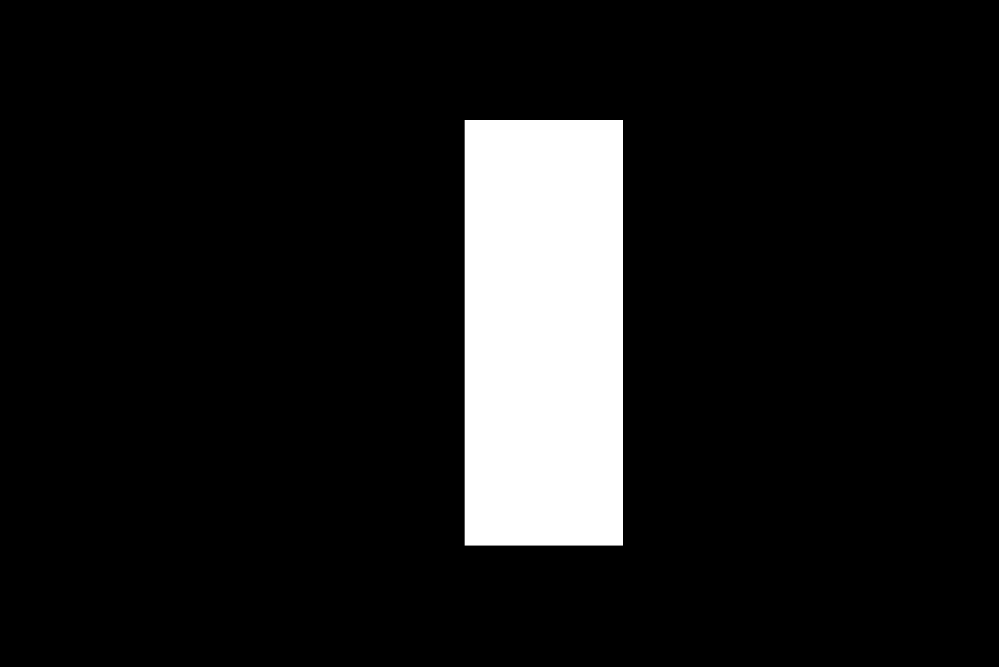

Maximum bin value: 3494 (Intensity: 30)
Generated Watermark Bits (first 50): [0 1 0 0 1 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 1 1 1 0 1 1 0 0 1 0 1 1 0]


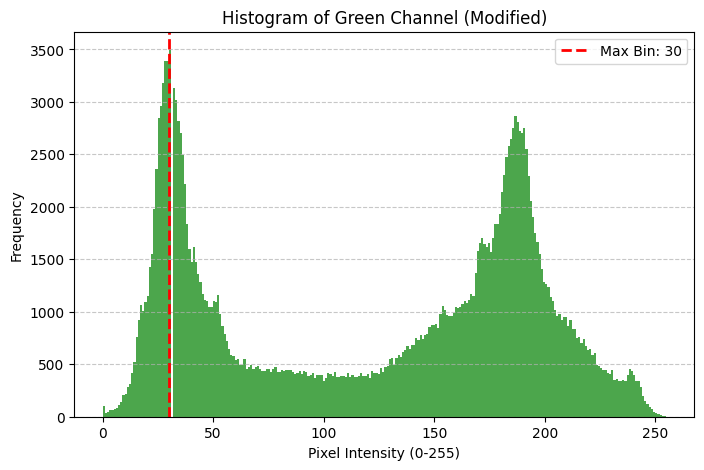

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2]
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1]

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin index and correct the intensity value
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(round(bin_edges[max_bin_index]))  # Convert to integer

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Increase pixel values that are greater than max_bin_intensity
green_channel[green_channel > max_bin_intensity] += 1

# Ensure values don't exceed 255
green_channel = np.clip(green_channel, 0, 255)

# Store modified green channel back into the image
first_box_pixels[:, :, 1] = green_channel

# Generate random watermark bits
watermark_bits = np.random.randint(0, 2, size=max_bin_value)
print(f"Generated Watermark Bits (first 50): {watermark_bits[:50]}")

# Save watermark bits
np.savetxt("watermark_bits.txt", watermark_bits, fmt="%d")

# Plot histogram after modification
plt.figure(figsize=(8, 5))
plt.hist(green_channel.flatten(), bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel (Modified)")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 261.1ms
Speed: 5.8ms preprocess, 261.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


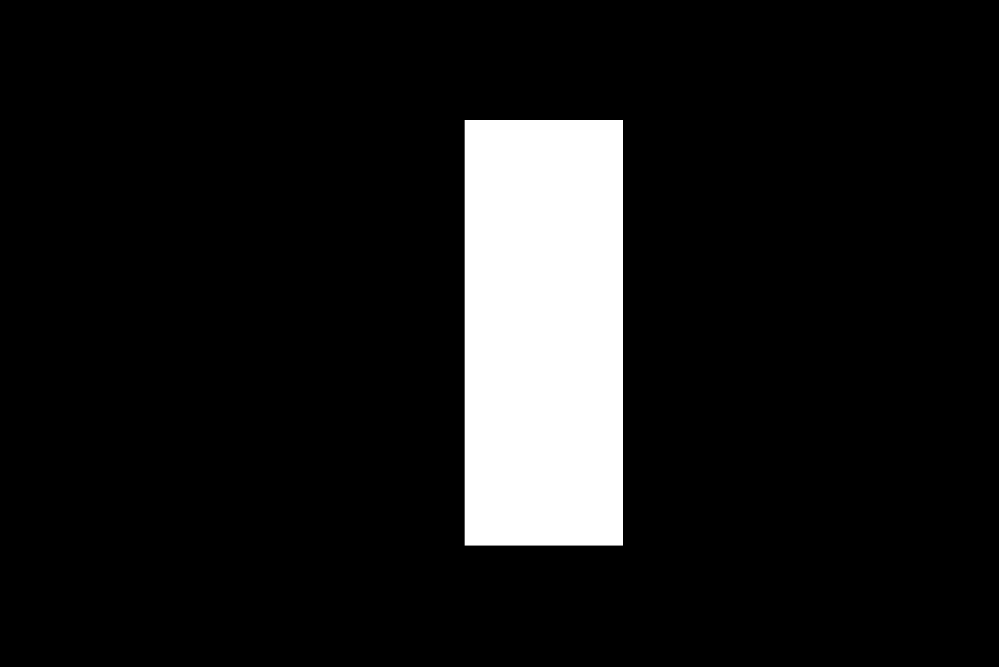

Maximum bin value: 3494 (Intensity: 30)
Generated Watermark Bits (first 50): [0 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0 0 1]


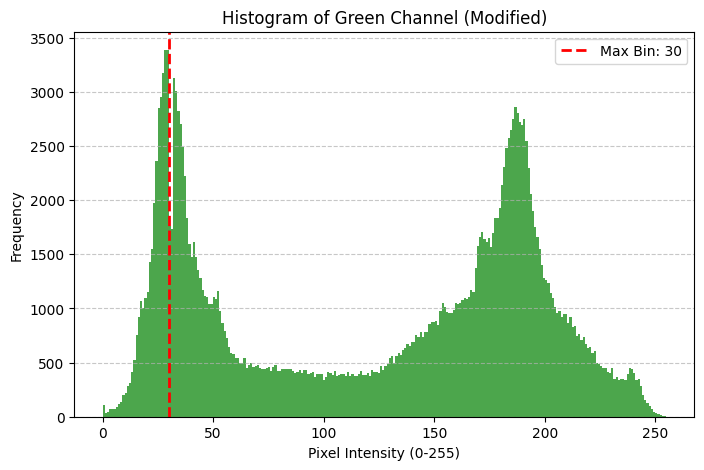

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2]
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1]

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin index and corresponding intensity
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(round(bin_edges[max_bin_index]))  # Convert to integer

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Increase pixel values that are greater than max_bin_intensity
green_channel[green_channel > max_bin_intensity] += 1
# Generate random watermark bits
watermark_bits = np.random.randint(0, 2, size=max_bin_value)
print(f"Generated Watermark Bits (first 50): {watermark_bits[:50]}")

# Modify pixels based on watermark bits
flat_green = green_channel.flatten()
indices = np.where(flat_green == max_bin_intensity)[0]  # Get indices of pixels with max_bin_intensity

# Apply watermark bits only up to the available pixels
num_pixels = min(len(indices), len(watermark_bits))

for i in range(num_pixels):
    if watermark_bits[i] == 1:
        flat_green[indices[i]] += 1  # Increase pixel intensity if watermark bit is 1

# Reshape green channel back to its original shape
green_channel = flat_green.reshape(green_channel.shape)

# Ensure values remain in [0, 255]
green_channel = np.clip(green_channel, 0, 255)

# Store modified green channel back into the image
first_box_pixels[:, :, 1] = green_channel

# Save the modified image
cv2.imwrite("modified_image.jpg", image)

# Plot histogram after modification
plt.figure(figsize=(8, 5))
plt.hist(green_channel.flatten(), bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel (Modified)")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 239.9ms
Speed: 5.3ms preprocess, 239.9ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


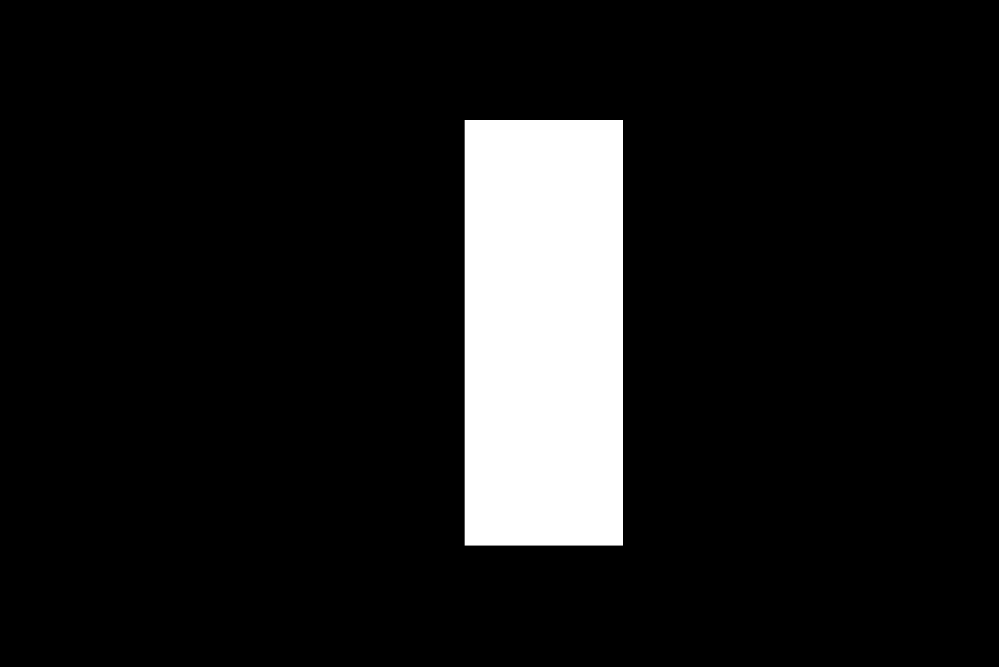

Maximum bin value: 3494 (Intensity: 30)
Generated Watermark Bits (first 50): [0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 0 0 0 1 0 0 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0 0]


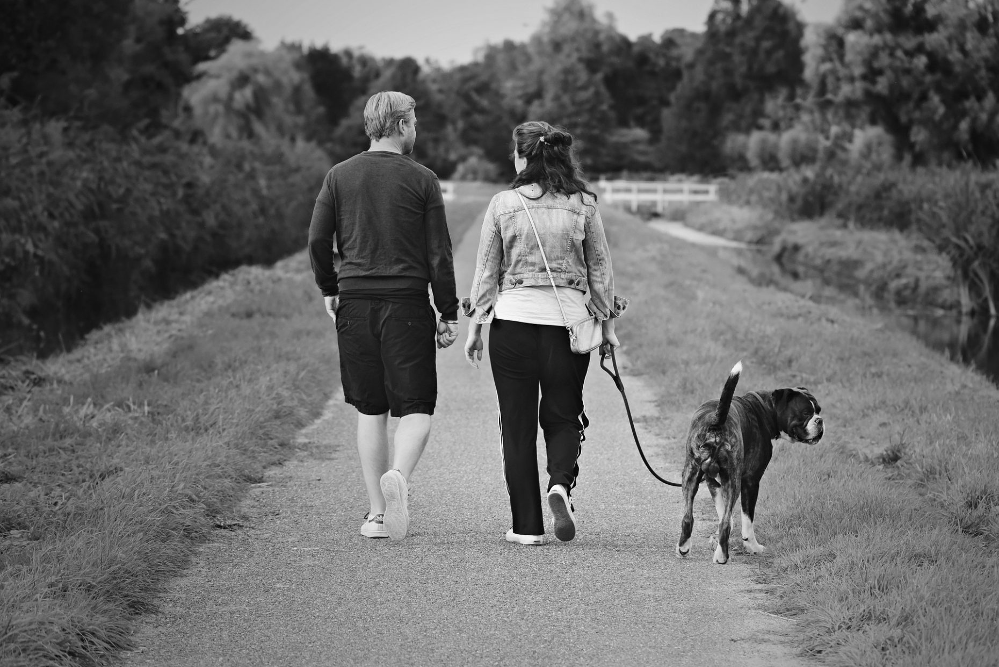

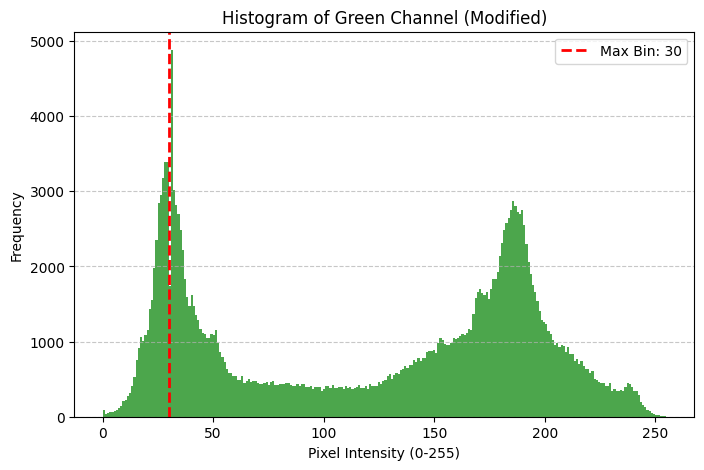

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
embedded_image = image.copy()  # Make a copy to modify
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False
bbox_coords = None  # Store bounding box coordinates

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        bbox_coords = (x1, y1, x2, y2)  # Store coordinates
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2].copy()  # Extract region
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1]

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin index and corresponding intensity
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(round(bin_edges[max_bin_index]))  # Convert to integer

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Generate random watermark bits
watermark_bits = np.random.randint(0, 2, size=max_bin_value)
print(f"Generated Watermark Bits (first 50): {watermark_bits[:50]}")

# Modify pixels based on watermark bits
flat_green = green_channel.flatten()
indices = np.where(flat_green == max_bin_intensity)[0]  # Get indices of pixels with max_bin_intensity

# Apply watermark bits only up to the available pixels
num_pixels = min(len(indices), len(watermark_bits))

for i in range(num_pixels):
    if watermark_bits[i] == 1:
        flat_green[indices[i]] += 1  # Increase pixel intensity if watermark bit is 1

# Reshape green channel back to its original shape
green_channel = flat_green.reshape(green_channel.shape)

# Ensure values remain in [0, 255]
green_channel = np.clip(green_channel, 0, 255)

# Store modified green channel back into the image
first_box_pixels[:, :, 1] = green_channel

# Embed the modified bounding box pixels back into the original image
if bbox_coords:
    x1, y1, x2, y2 = bbox_coords
    embedded_image[y1:y2, x1:x2] = first_box_pixels  # Replace with modified pixels

# Save the final embedded image
cv2.imwrite("embedded_image.jpg", embedded_image)
cv2_imshow(embedded_image)

# Plot histogram after modification
plt.figure(figsize=(8, 5))
plt.hist(green_channel.flatten(), bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel (Modified)")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 238.6ms
Speed: 6.0ms preprocess, 238.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


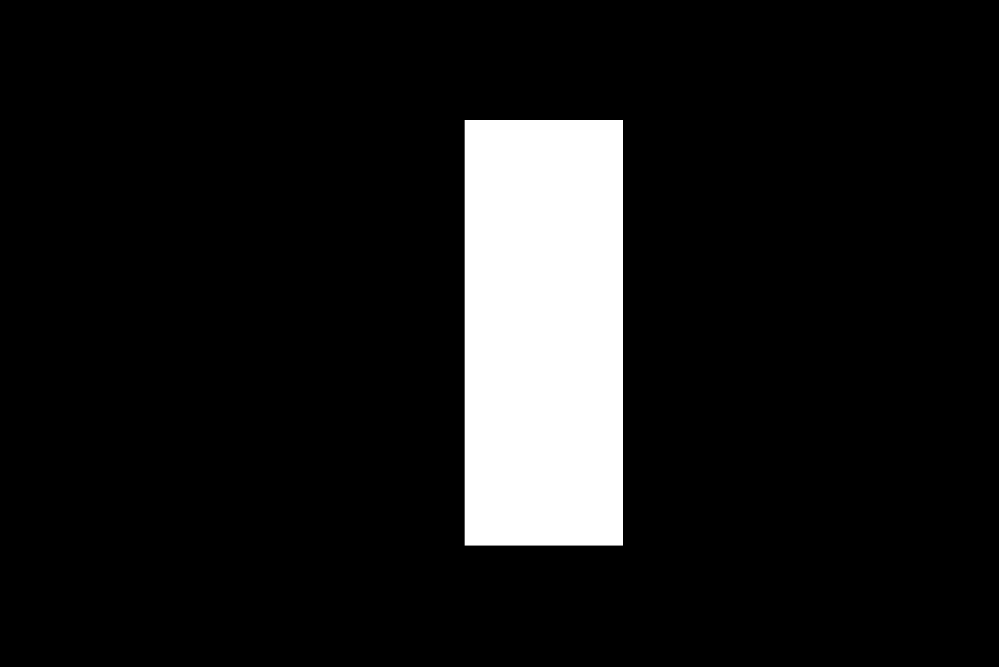

Maximum bin value: 3494 (Intensity: 29)
Generated Watermark Bits (first 50): [1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 1 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0]
Total number of pixels with intensity 255 in green channel: 6
Sample locations of pixels with intensity 255: [(353, 57), (548, 64), (562, 218), (605, 70), (618, 68), (682, 165)]


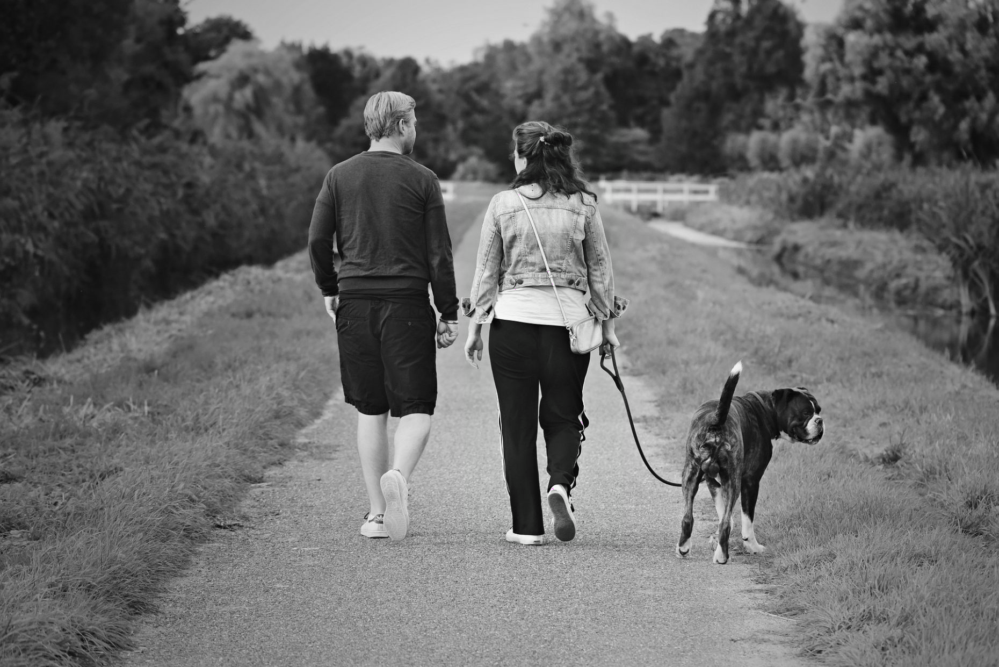

PSNR between original and embedded image: 63.45 dB


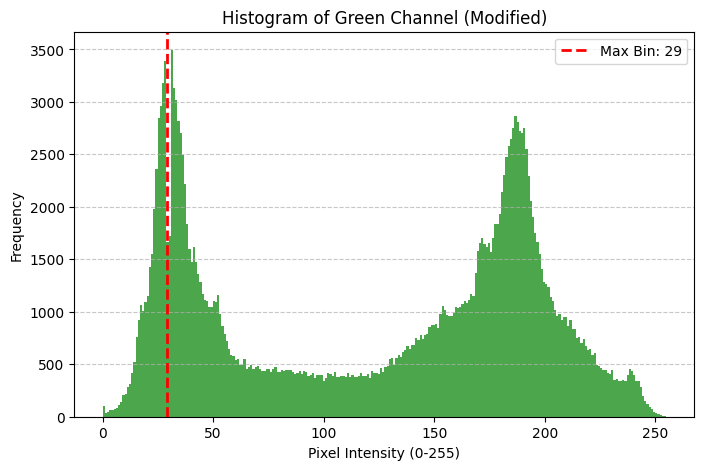

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Function to compute PSNR
def compute_psnr(original, modified):
    mse = np.mean((original - modified) ** 2)
    if mse == 0:
        return float('inf')  # No difference
    psnr = 10 * np.log10((255 ** 2) / mse)
    return psnr

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
embedded_image = image.copy()
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False
bbox_coords = None

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        bbox_coords = (x1, y1, x2, y2)
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2].copy()
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1]

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin intensity
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(bin_edges[max_bin_index])

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")
# Increase pixel values that are greater than max_bin_intensity
green_channel[green_channel > max_bin_intensity] += 1
# Generate random watermark bits
watermark_bits = np.random.randint(0, 2, size=max_bin_value)
print(f"Generated Watermark Bits (first 50): {watermark_bits[:50]}")

# Modify pixels based on watermark bits
flat_green = green_channel.flatten()
# Find locations where intensity is 255 in the green channel
green_255_indices = np.where(green_channel == 255)

# Count the number of pixels with intensity 255
num_255_pixels = np.count_nonzero(green_channel == 255)

print(f"Total number of pixels with intensity 255 in green channel: {num_255_pixels}")

# Print first few pixel locations
print(f"Sample locations of pixels with intensity 255: {list(zip(green_255_indices[0][:10], green_255_indices[1][:10]))}")

indices = np.where(flat_green == max_bin_intensity)[0]

num_pixels = min(len(indices), len(watermark_bits))

for i in range(num_pixels):
    if watermark_bits[i] == 1:
        flat_green[indices[i]] += 1

# Reshape green channel back
green_channel = flat_green.reshape(green_channel.shape)

# Ensure values remain in range
green_channel = np.clip(green_channel, 0, 255)

# Store modified green channel back
first_box_pixels[:, :, 1] = green_channel

# Embed modified bounding box pixels
if bbox_coords:
    x1, y1, x2, y2 = bbox_coords
    embedded_image[y1:y2, x1:x2] = first_box_pixels

# Save the final embedded image
cv2.imwrite("embedded_image.jpg", embedded_image)
cv2_imshow(embedded_image)

# Compute PSNR
psnr_value = compute_psnr(image, embedded_image)
print(f"PSNR between original and embedded image: {psnr_value:.2f} dB")

# Plot histogram after modification
plt.figure(figsize=(8, 5))
plt.hist(green_channel.flatten(), bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel (Modified)")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
results= model("embedded_image.jpg")
for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

result.save("output1.jpg")



image 1/1 /content/embedded_image.jpg: 448x640 2 persons, 1 dog, 268.1ms
Speed: 9.4ms preprocess, 268.1ms inference, 4.1ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865.692138671875, 223.81654357910156, 1160.466796875, 1014.9559936523438)
Class: 0, Confidence: 0.91, BBox: (572.578369140625, 168.87062072753906, 856.7377319335938, 1009.921875)
Class: 16, Confidence: 0.91, BBox: (1260.0389404296875, 670.166259765625, 1534.8890380859375, 1050.92919921875)


'output1.jpg'


image 1/1 /content/embedded_image.jpg: 448x640 2 persons, 1 dog, 232.0ms
Speed: 5.7ms preprocess, 232.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1014)
Class: 0, Confidence: 0.91, BBox: (572, 168, 856, 1009)
Class: 16, Confidence: 0.91, BBox: (1260, 670, 1534, 1050)


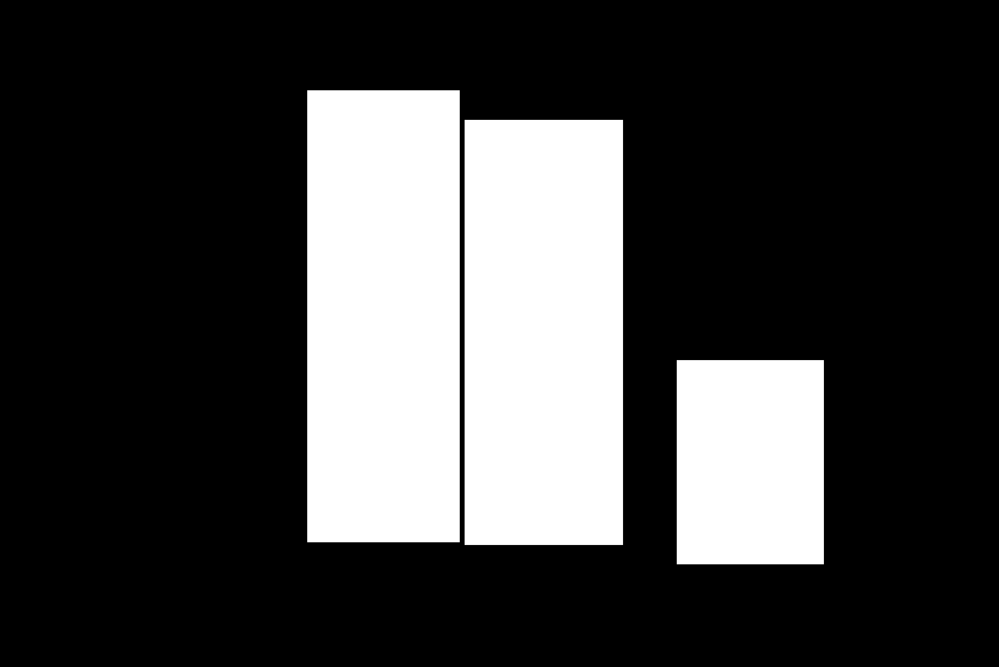

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')# Load the appropriate model
results= model("embedded_image.jpg")

# Read the original image
image = cv2.imread("embedded_image.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)  # Set pixel values to white

# Save the output image
cv2.imwrite("output1.jpg", masked_image)
cv2_imshow(masked_image) # Use cv2_imshow instead of cv2.imshow


image 1/1 /content/embedded_image.jpg: 448x640 2 persons, 1 dog, 157.3ms
Speed: 3.5ms preprocess, 157.3ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1014)


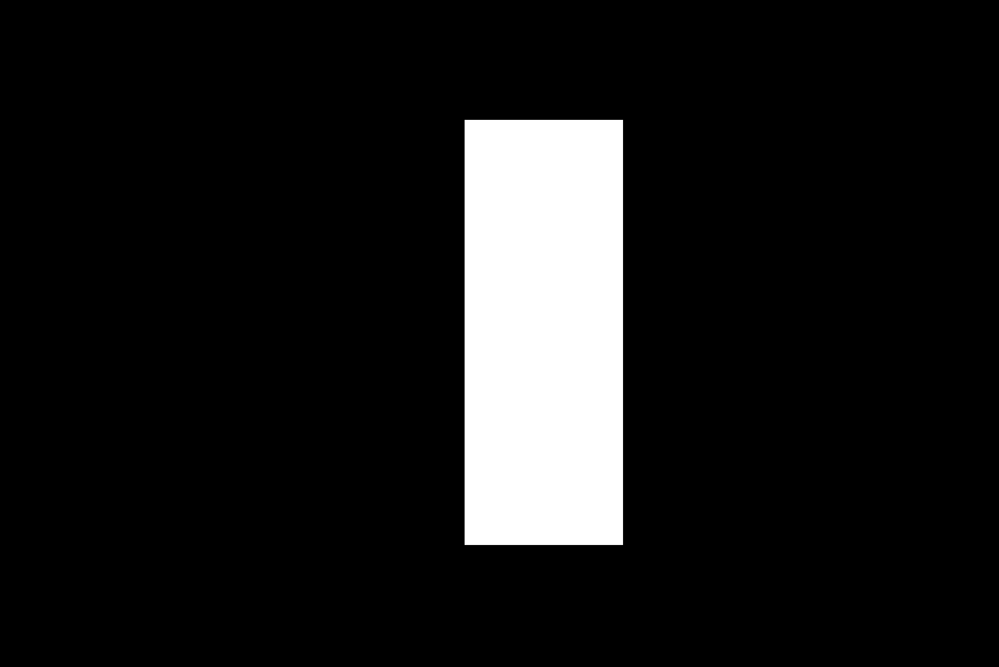

Total number of white pixels: 233345
First bounding box pixel values (sample): [[[58, 58, 58], [57, 57, 57], [56, 56, 56], [55, 55, 55], [54, 54, 54], [54, 54, 54], [54, 54, 54], [54, 54, 54], [55, 55, 55], [57, 57, 57], [58, 58, 58], [59, 59, 59], [59, 59, 59], [58, 58, 58], [58, 58, 58], [62, 62, 62], [62, 62, 62], [62, 62, 62], [63, 63, 63], [64, 64, 64], [65, 65, 65], [66, 66, 66], [67, 67, 67], [72, 72, 72], [73, 73, 73], [75, 75, 75], [76, 76, 76], [76, 76, 76], [75, 75, 75], [73, 73, 73], [71, 71, 71], [76, 76, 76], [74, 74, 74], [72, 72, 72], [70, 70, 70], [68, 68, 68], [65, 65, 65], [62, 62, 62], [60, 60, 60], [63, 63, 63], [63, 63, 63], [62, 62, 62], [62, 62, 62], [63, 63, 63], [63, 63, 63], [64, 64, 64], [65, 65, 65], [62, 62, 62], [62, 62, 62], [61, 61, 61], [59, 59, 59], [57, 57, 57], [55, 55, 55], [53, 53, 53], [52, 52, 52], [52, 52, 52], [50, 50, 50], [49, 49, 49], [48, 48, 48], [48, 48, 48], [49, 49, 49], [48, 48, 48], [47, 47, 47], [50, 50, 50], [48, 48, 48], [48, 48, 

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results= model("embedded_image.jpg")

# Read the original image
image = cv2.imread("embedded_image.jpg")
masked_image = np.zeros_like(image)  # Create a black image of the same size

first_box_pixels = []  # List to store pixel values of the first bounding box

# Process only the first bounding box
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break  # Stop after processing the first bounding box

        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
        conf = box.conf[0]  # Confidence
        cls = int(box.cls[0])  # Class

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        # Fill the bounding box with white
        masked_image[y1:y2, x1:x2] = (255, 255, 255)  # Set pixel values to white

        # Extract pixel values within the first bounding box
        first_box_pixels = image[y1:y2, x1:x2].tolist()  # Convert to list for easier handling
        first_box_found = True  # Mark that the first box is processed

# Save the output image
cv2.imwrite("output1.jpg", masked_image)
cv2_imshow(masked_image)  # Use cv2_imshow instead of cv2.imshow

# Compute the number of white pixels
gray_image = cv2.cvtColor(masked_image, cv2.COLOR_BGR2GRAY)
_, binary_mask = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY)
white_pixel_count = np.sum(binary_mask == 255)

print(f"Total number of white pixels: {white_pixel_count}")

# Display the first bounding box pixel values
print(f"First bounding box pixel values (sample): {first_box_pixels[:5]}")  # Print only first 5 rows for brevity



image 1/1 /content/embedded_image.jpg: 448x640 2 persons, 1 dog, 249.7ms
Speed: 6.0ms preprocess, 249.7ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1014)


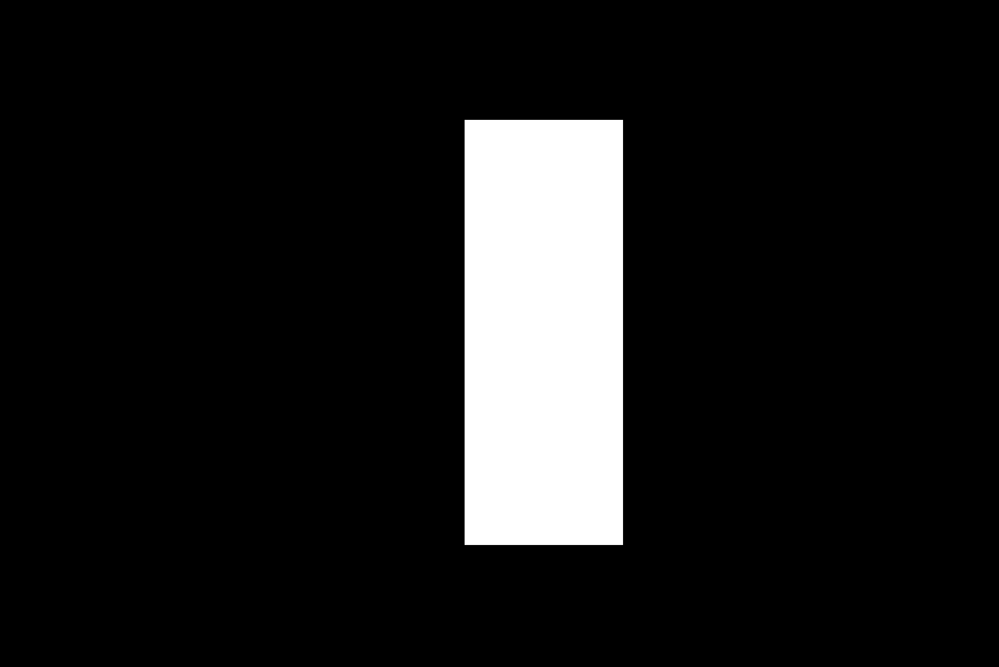

Number of pixels with intensity 30: 2213
Maximum bin value: 3080 (Intensity: 31)
Pixels with intensity 31: 3063


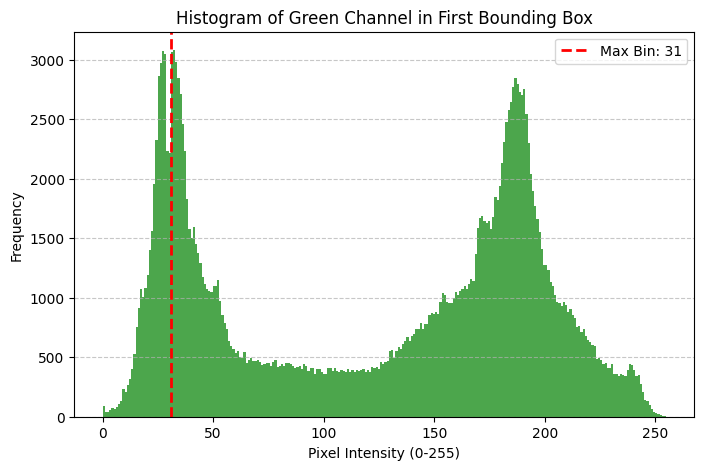

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load the model
model = YOLO('yolov8n.pt')
results= model("embedded_image.jpg")

# Read the original image
image = cv2.imread("embedded_image.jpg")
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2]
        first_box_found = True

cv2.imwrite("output1.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1].flatten()

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

def count_intensity_pixels(intensity_value):
    if 0 <= intensity_value <= 255:
        return hist_values[intensity_value]
    else:
        return 0  # Invalid intensity value

# Example: Count pixels with intensity 120
specific_intensity = 30
pixel_count = count_intensity_pixels(specific_intensity)

print(f"Number of pixels with intensity {specific_intensity}: {pixel_count}")


# Find max bin index and correct the intensity value
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity =int( bin_edges[max_bin_index] )# Convert to integer

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Count how many pixels have this intensity
matching_pixels = np.sum(green_channel == max_bin_intensity)
print(f"Pixels with intensity {max_bin_intensity}: {matching_pixels}")

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(green_channel, bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel in First Bounding Box")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



image 1/1 /content/persondog_gray.jpg: 448x640 2 persons, 1 dog, 258.2ms
Speed: 5.8ms preprocess, 258.2ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Class: 0, Confidence: 0.93, BBox: (865, 223, 1160, 1015)


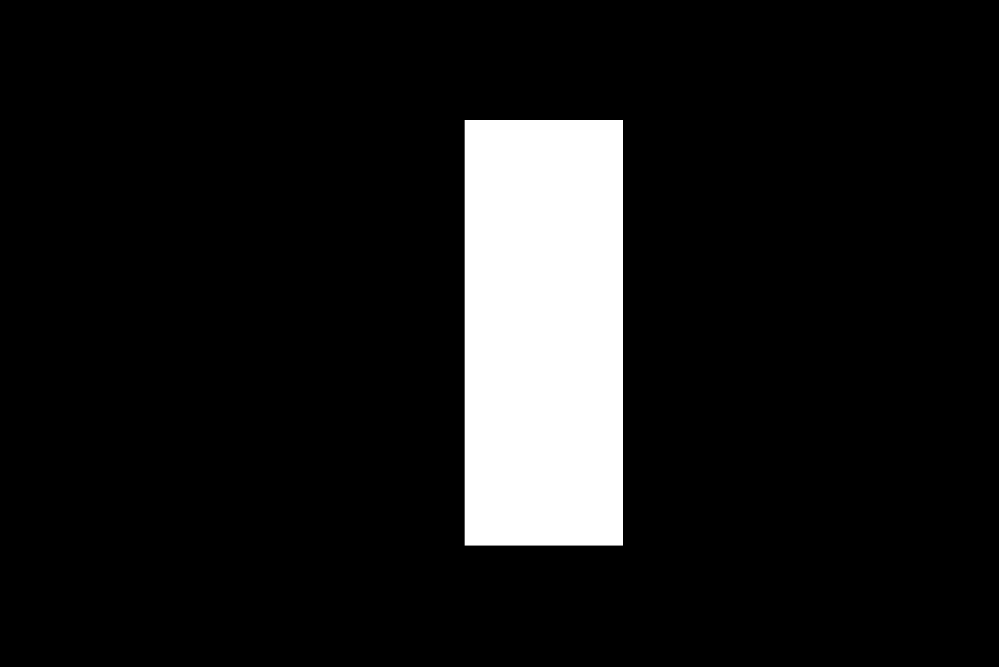

Maximum bin value: 3494 (Intensity: 29)
Generated Watermark Bits (first 50): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


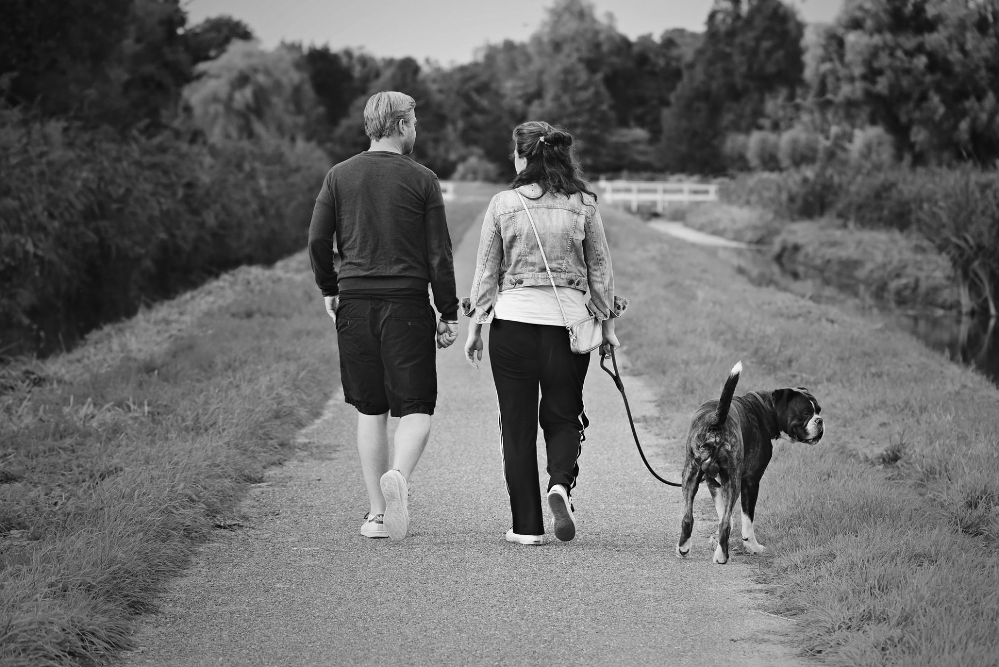

PSNR between original and embedded image: inf dB


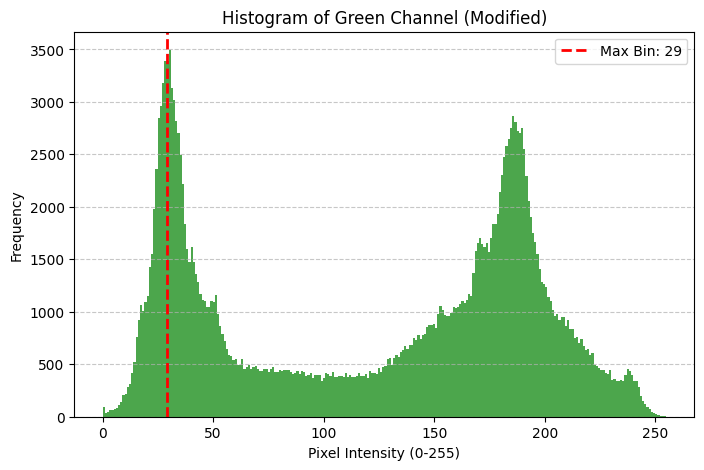

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Function to compute PSNR
def compute_psnr(original, modified):
    mse = np.mean((original - modified) ** 2)
    if mse == 0:
        return float('inf')  # No difference
    psnr = 10 * np.log10((255 ** 2) / mse)
    return psnr

# Load the model
model = YOLO('yolov8n.pt')
results = model("persondog_gray.jpg")

# Read the original image
image = cv2.imread("persondog_gray.jpg")
embedded_image = image.copy()
masked_image = np.zeros_like(image)

first_box_pixels = []
first_box_found = False
bbox_coords = None

for result in results:
    for box in result.boxes:
        if first_box_found:
            break

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        bbox_coords = (x1, y1, x2, y2)
        conf = box.conf[0]
        cls = int(box.cls[0])

        print(f"Class: {cls}, Confidence: {conf:.2f}, BBox: ({x1}, {y1}, {x2}, {y2})")

        masked_image[y1:y2, x1:x2] = (255, 255, 255)
        first_box_pixels = image[y1:y2, x1:x2].copy()
        first_box_found = True

cv2.imwrite("output.jpg", masked_image)
cv2_imshow(masked_image)

# Extract the green channel
green_channel = first_box_pixels[:, :, 1]

# Compute histogram
hist_values, bin_edges = np.histogram(green_channel, bins=256, range=(0, 255))

# Find max bin intensity
max_bin_value = np.max(hist_values)
max_bin_index = np.argmax(hist_values)
max_bin_intensity = int(bin_edges[max_bin_index])

print(f"Maximum bin value: {max_bin_value} (Intensity: {max_bin_intensity})")

# Generate random watermark bits
watermark_bits = np.random.randint(0, 1, size=max_bin_value)
print(f"Generated Watermark Bits (first 50): {watermark_bits[:50]}")

# Modify pixels based on watermark bits
flat_green = green_channel.flatten()
indices = np.where(flat_green == max_bin_intensity)[0]

num_pixels = min(len(indices), len(watermark_bits))

for i in range(num_pixels):
    if watermark_bits[i] == 1:
        flat_green[indices[i]] += 1

# Reshape green channel back
green_channel = flat_green.reshape(green_channel.shape)

# Ensure values remain in range
green_channel = np.clip(green_channel, 0, 255)

# Store modified green channel back
first_box_pixels[:, :, 1] = green_channel

# Embed modified bounding box pixels
if bbox_coords:
    x1, y1, x2, y2 = bbox_coords
    embedded_image[y1:y2, x1:x2] = first_box_pixels

# Save the final embedded image
cv2.imwrite("embedded_image.jpg", embedded_image)
cv2_imshow(embedded_image)

# Compute PSNR
psnr_value = compute_psnr(image, embedded_image)
print(f"PSNR between original and embedded image: {psnr_value:.2f} dB")

# Plot histogram after modification
plt.figure(figsize=(8, 5))
plt.hist(green_channel.flatten(), bins=256, color='green', alpha=0.7)
plt.axvline(x=max_bin_intensity, color='red', linestyle='dashed', linewidth=2, label=f"Max Bin: {max_bin_intensity}")
plt.title("Histogram of Green Channel (Modified)")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()
